# Project Description

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.  
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things: 
  
#### Dataset Description:
Number of columns: 23
  
Date  - The date of observation  
Location  -The common name of the location of the weather station  
MinTemp  -The minimum temperature in degrees celsius  
MaxTemp -The maximum temperature in degrees celsius  
Rainfall  -The amount of rainfall recorded for the day in mm  
Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am  
Sunshine  -The number of hours of bright sunshine in the day.  
WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight  
WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight  
WindDir9am -Direction of the wind at 9am  
WindDir3pm -Direction of the wind at 3pm  
WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am  
WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm  
Humidity9am -Humidity (percent) at 9am  
Humidity3pm -Humidity (percent) at 3pm  
Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am  
Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm  
Cloud9am - Fraction of sky obscured by cloud at 9am.   
Cloud3pm -Fraction of sky obscured by cloud   
Temp9am-Temperature (degrees C) at 9am  
Temp3pm -Temperature (degrees C) at 3pm  
RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0  
RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".


#### Problem Statement:  

  a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.  

  b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

## Importing Libraries & Data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

from sklearn import preprocessing
from sklearn import metrics
from sklearn.model_selection import train_test_split

import lazypredict

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv')

## Understanding the Data

In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [5]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8350.000000,8365.000000,8185.000000,4913.000000,4431.000000,7434.000000,8349.000000,8318.000000,8366.000000,8323.000000,7116.000000,7113.000000,6004.000000,5970.000000,8369.000000,8329.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.403596,6.136408,10.459379,5.044484,3.896235,14.665721,10.174579,9.766986,16.833283,18.423774,6.828699,6.766681,2.877658,2.731659,5.627035,5.980020
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.200000,19.300000,0.000000,2.600000,4.750000,30.000000,6.000000,11.000000,56.000000,39.000000,1013.000000,1010.400000,1.000000,2.000000,13.800000,18.000000
50%,13.300000,23.300000,0.000000,4.600000,8.700000,39.000000,13.000000,19.000000,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000
75%,17.400000,28.000000,1.000000,7.000000,10.700000,50.000000,20.000000,24.000000,80.000000,63.000000,1022.300000,1019.800000,7.000000,7.000000,21.900000,26.400000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


In [6]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [7]:
for i in df.columns:
    if df[i].dtypes == 'object':
        print(df[i].value_counts())

Date
2011-01-31    5
2011-05-08    5
2011-05-21    5
2011-05-20    5
2011-05-19    5
             ..
2013-01-28    1
2013-01-29    1
2013-01-30    1
2013-01-31    1
2013-06-08    1
Name: count, Length: 3004, dtype: int64
Location
Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: count, dtype: int64
WindGustDir
N      713
SSE    578
S      577
SW     572
E      557
WNW    531
W      507
WSW    504
SE     484
ENE    415
SSW    396
NW     383
NE     353
NNE    343
ESE    302
NNW    219
Name: count, dtype: int64
WindDir9am
N      906
SW     704
NW     625
WSW    543
SE     505
WNW    480
SSW    467
ENE    433
NNE    430
W      414
NE     409
S      402
E      380
SSE    365
NNW    280
ESE    253
Name: count, dtype: int64
WindDir3pm
SE     813
S      742
SSE    623
WSW    580
NE     544

## Preparation of the Data

In [8]:
df['Date'] = pd.to_datetime(df['Date'])
df['day'] = df['Date'].dt.day
df['month'] = df['Date'].dt.month
df['year'] = df['Date'].dt.year

df = df.drop(['Date'], axis=1)

In [9]:
for column in df.columns:
    if df[column].dtype == 'object':
        df[column] = df.groupby(['Location', 'month'])[column].transform(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else np.nan))
    else:
        df[column] = df.groupby(['Location', 'month'])[column].transform(lambda x: x.fillna(x.mean()))

In [10]:
df.isnull().sum()

Location            0
MinTemp             0
MaxTemp             0
Rainfall            0
Evaporation      2724
Sunshine         3347
WindGustDir       822
WindGustSpeed     822
WindDir9am          0
WindDir3pm          0
WindSpeed9am        0
WindSpeed3pm        0
Humidity9am         0
Humidity3pm         0
Pressure9am      1304
Pressure3pm      1304
Cloud9am          687
Cloud3pm          687
Temp9am             0
Temp3pm             0
RainToday           0
RainTomorrow        0
day                 0
month               0
year                0
dtype: int64

In [11]:
df = df.drop(['WindGustDir', 'WindGustSpeed', 'Cloud9am', 'Cloud3pm'], axis=1)

In [12]:
for column in df.columns:
    if df[column].dtype == 'object':
        df[column] = df[column].transform(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else np.nan))
    else:
        df[column] = df[column].transform(lambda x: x.fillna(x.mean()))

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 21 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Location      8425 non-null   object 
 1   MinTemp       8425 non-null   float64
 2   MaxTemp       8425 non-null   float64
 3   Rainfall      8425 non-null   float64
 4   Evaporation   8425 non-null   float64
 5   Sunshine      8425 non-null   float64
 6   WindDir9am    8425 non-null   object 
 7   WindDir3pm    8425 non-null   object 
 8   WindSpeed9am  8425 non-null   float64
 9   WindSpeed3pm  8425 non-null   float64
 10  Humidity9am   8425 non-null   float64
 11  Humidity3pm   8425 non-null   float64
 12  Pressure9am   8425 non-null   float64
 13  Pressure3pm   8425 non-null   float64
 14  Temp9am       8425 non-null   float64
 15  Temp3pm       8425 non-null   float64
 16  RainToday     8425 non-null   object 
 17  RainTomorrow  8425 non-null   object 
 18  day           8425 non-null 

## Understanding Features

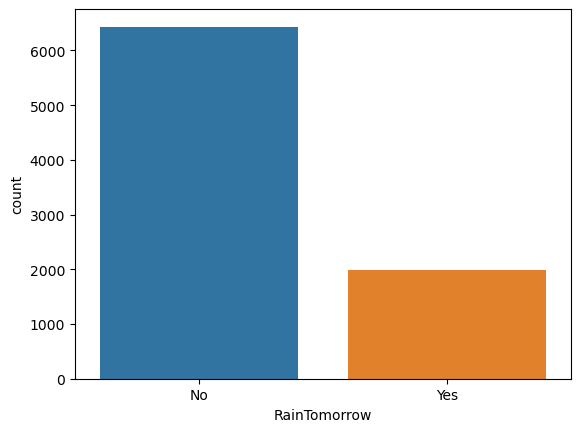

In [14]:
sns.countplot(x='RainTomorrow', data=df);

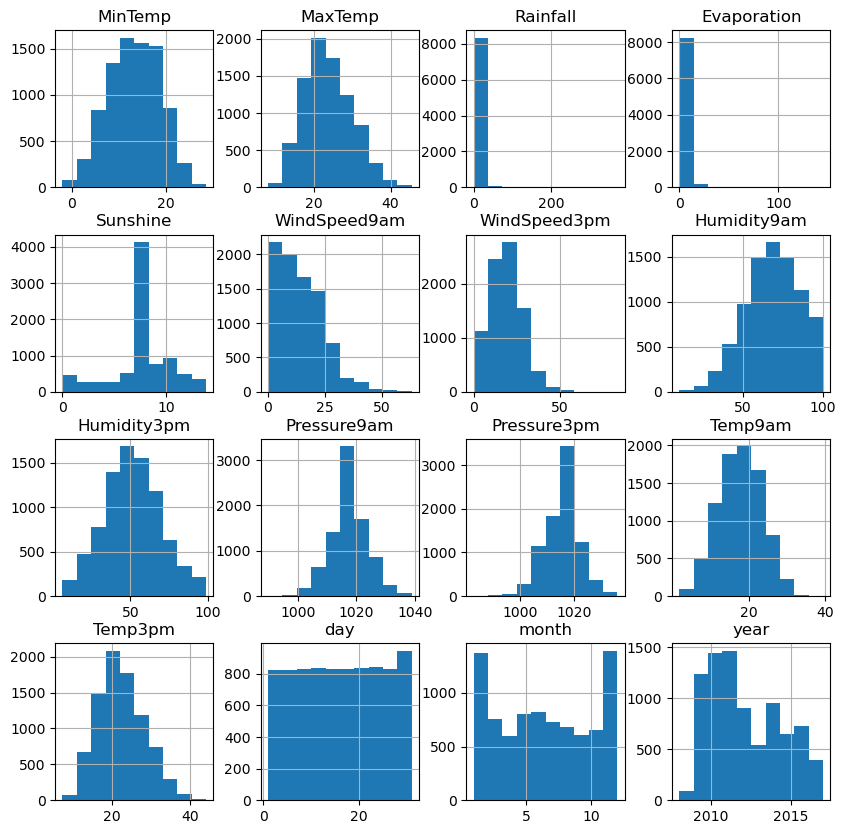

In [15]:
df.hist(bins=10,figsize=(10,10));

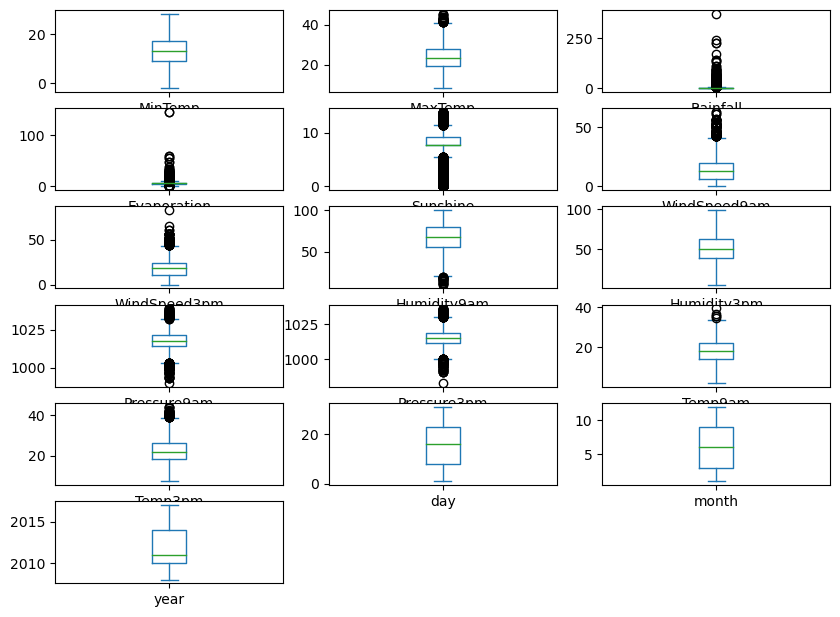

In [16]:
df.plot(kind='box',subplots=True,layout=(8,3),figsize=(10,10));

## Understanding Feature Relationships

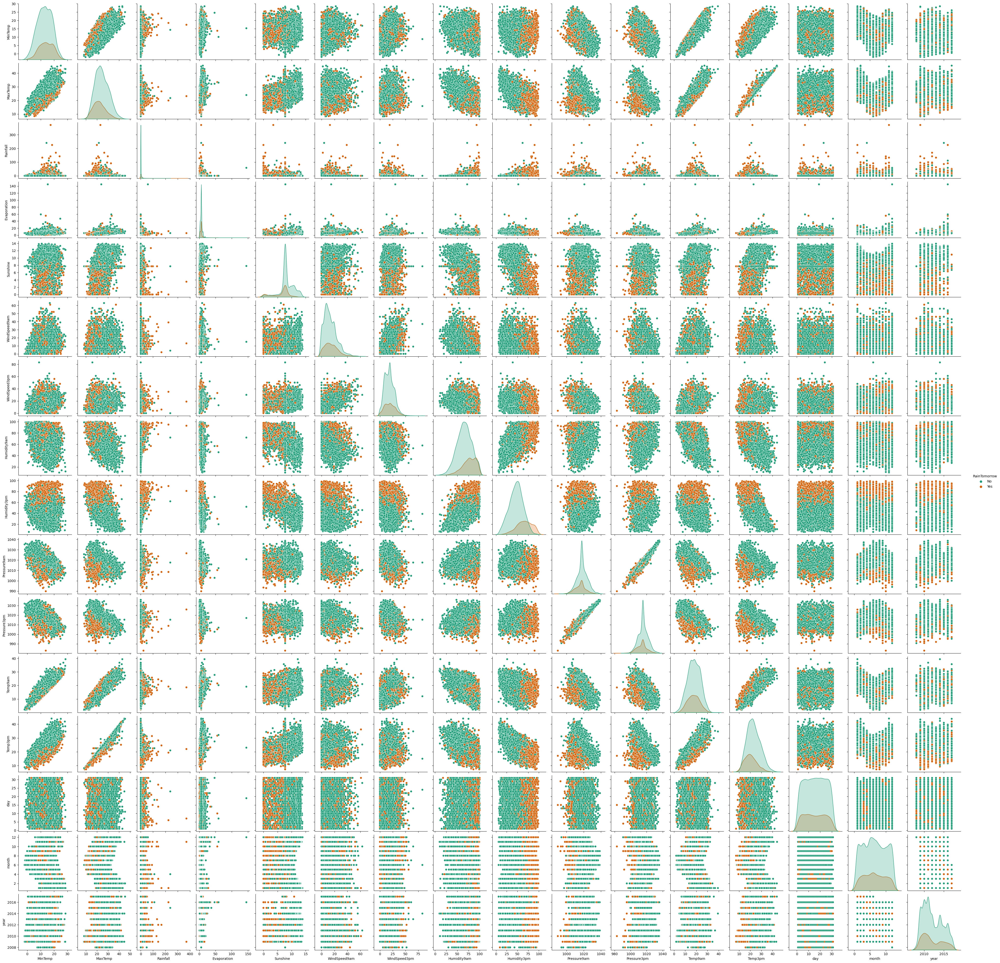

In [17]:
sns.pairplot(df, palette="Dark2", hue='RainTomorrow');

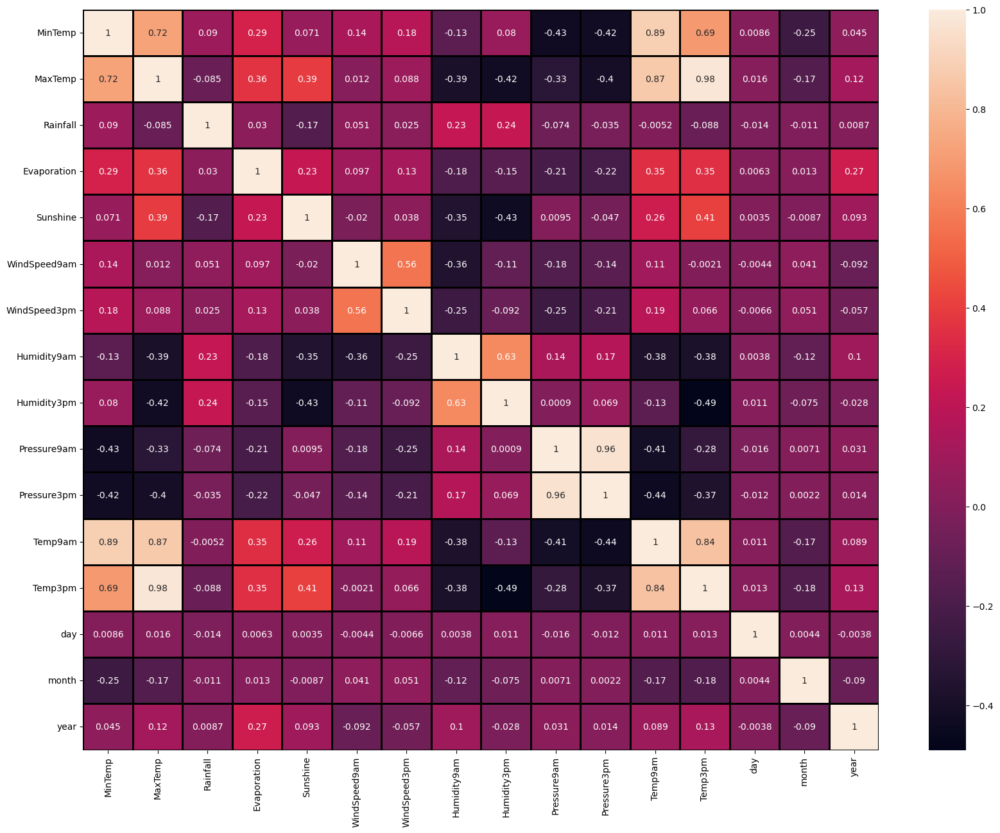

In [18]:
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(numeric_only=True), annot=True, linewidths=1, linecolor='black');

In [19]:
from sklearn.preprocessing import OrdinalEncoder
OE = OrdinalEncoder()
for i in df.columns:
    if df[i].dtypes == 'object':
        df[i] = OE.fit_transform(df[i].values.reshape(-1, 1))
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,day,month,year
0,1.0,13.4,22.900000,0.6,5.858132,7.714689,13.0,14.0,20.0,24.0,71.0,22.0,1007.7,1007.1,16.9,21.8,0.0,0.0,1,12,2008
1,1.0,7.4,25.100000,0.0,5.858132,7.714689,6.0,15.0,4.0,22.0,44.0,25.0,1010.6,1007.8,17.2,24.3,0.0,0.0,2,12,2008
2,1.0,12.9,25.700000,0.0,5.858132,7.714689,13.0,15.0,19.0,26.0,38.0,30.0,1007.6,1008.7,21.0,23.2,0.0,0.0,3,12,2008
3,1.0,9.2,28.000000,0.0,5.858132,7.714689,9.0,0.0,11.0,9.0,45.0,16.0,1017.6,1012.8,18.1,26.5,0.0,0.0,4,12,2008
4,1.0,17.5,32.300000,1.0,5.858132,7.714689,1.0,7.0,7.0,20.0,82.0,33.0,1010.8,1006.0,17.8,29.7,0.0,0.0,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.400000,0.0,5.858132,7.714689,9.0,1.0,13.0,11.0,51.0,24.0,1024.6,1020.3,10.1,22.4,0.0,0.0,21,6,2017
8421,9.0,3.6,25.300000,0.0,5.858132,7.714689,9.0,3.0,13.0,9.0,56.0,21.0,1023.5,1019.1,10.9,24.5,0.0,0.0,22,6,2017
8422,9.0,5.4,26.900000,0.0,5.858132,7.714689,9.0,14.0,9.0,9.0,53.0,24.0,1021.0,1016.8,12.5,26.1,0.0,0.0,23,6,2017
8423,9.0,7.8,27.000000,0.0,5.858132,7.714689,10.0,3.0,13.0,7.0,51.0,24.0,1019.4,1016.5,15.1,26.0,0.0,0.0,24,6,2017


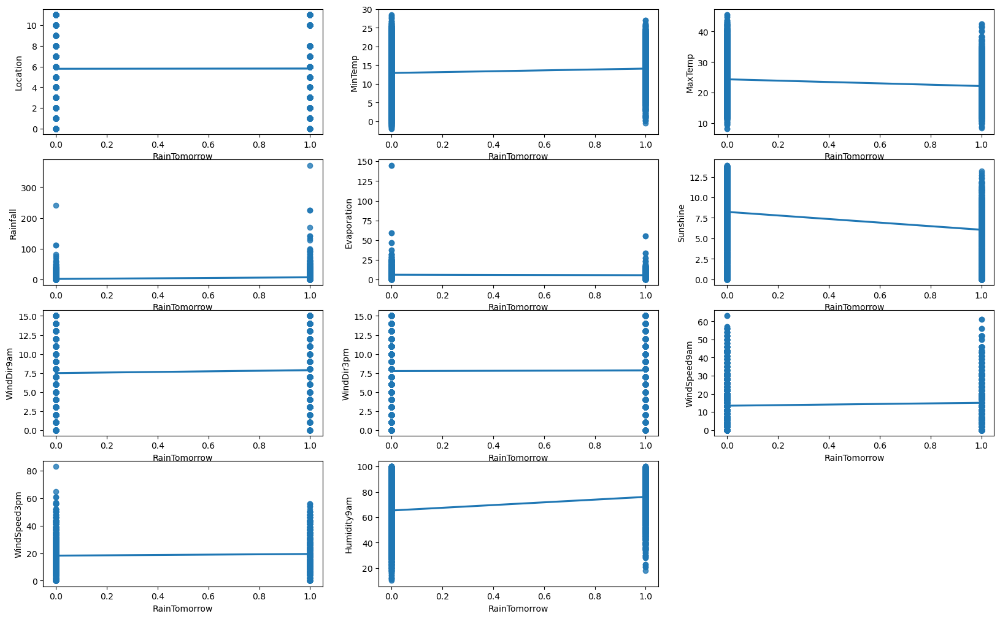

In [20]:
plt.figure(figsize=(20,25))
p=1
for i in df:
    if p<=11:
        plt.subplot(8,3,p)
        sns.regplot(x='RainTomorrow', y=i, data=df)
        plt.xlabel('RainTomorrow')
        plt.ylabel(i)
    p+=1
plt.show()

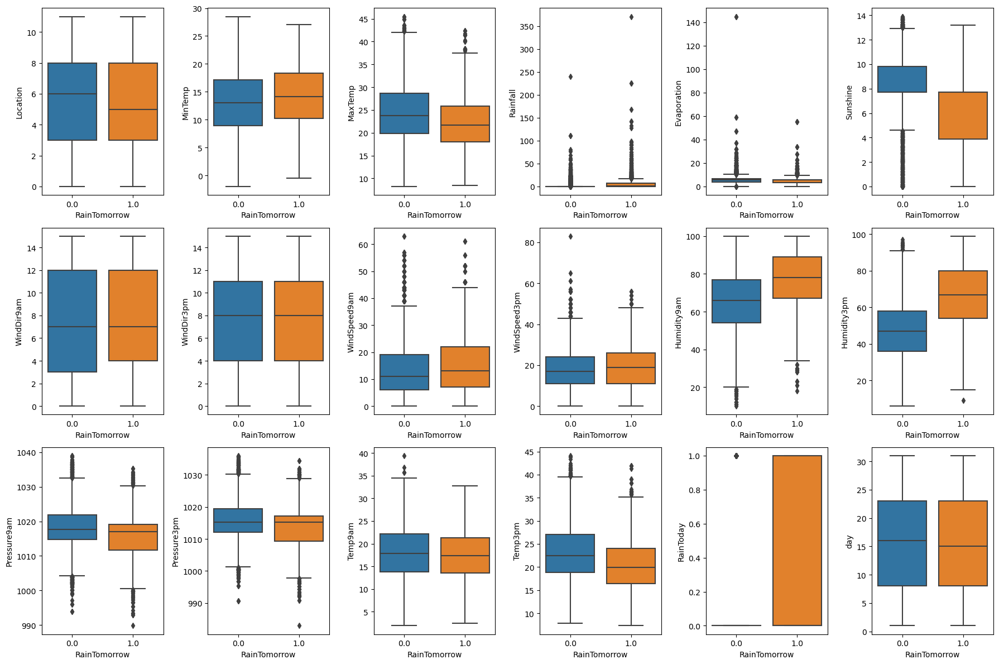

In [21]:
fig, axs = plt.subplots(3, 6, figsize=(18,12))
features = df.drop('RainTomorrow', axis=1).columns
for i, ax in enumerate(axs.flatten()):
    sns.boxplot(x='RainTomorrow', y=features[i], data=df, ax=ax)
plt.tight_layout()
plt.show()

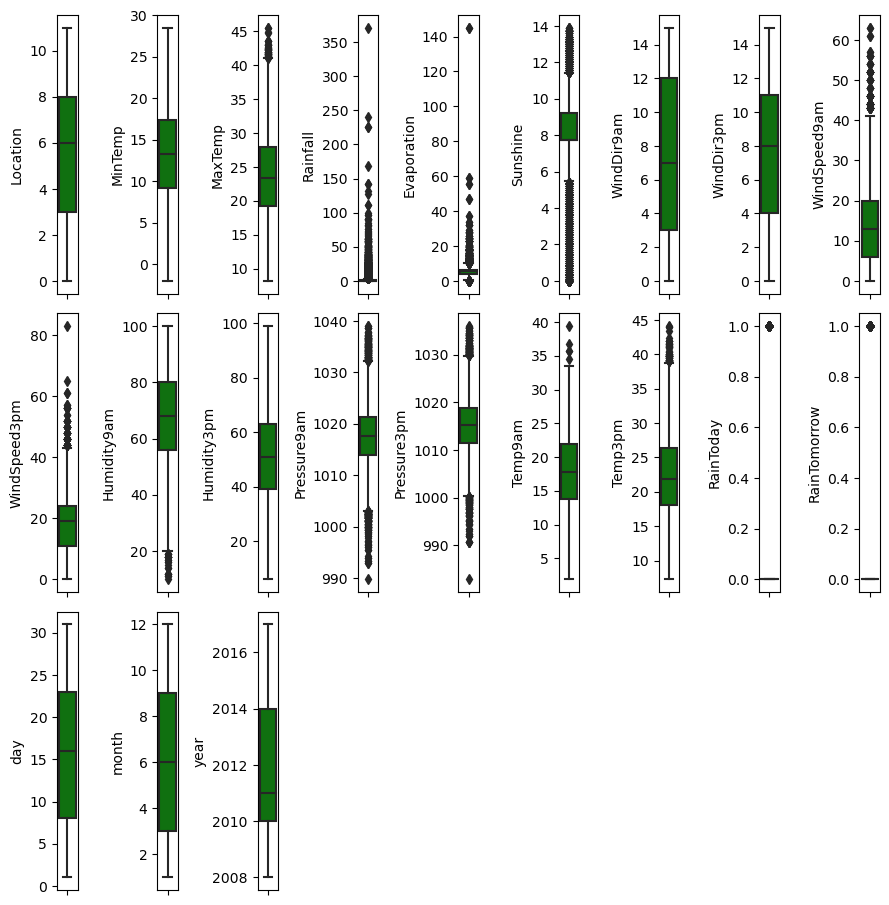

In [22]:
#checking outliers

collist=df.columns.values
ncol= 9
nrows= 9

plt.figure(figsize=(ncol,3*ncol))
for i in range(0,len(collist)):
    plt.subplot(nrows, ncol, i+1)
    sns.boxplot(y=df[collist[i]], color='green', orient='x')
    plt.tight_layout()

## Model Preparation - RainTomorrow

In [23]:
df_skew = df.skew()
df_skew

Location        -0.050456
MinTemp         -0.093855
MaxTemp          0.376901
Rainfall        13.196745
Evaporation     11.253879
Sunshine        -0.763553
WindDir9am       0.013058
WindDir3pm      -0.097516
WindSpeed9am     0.961068
WindSpeed3pm     0.503518
Humidity9am     -0.263182
Humidity3pm      0.111302
Pressure9am     -0.024027
Pressure3pm     -0.010605
Temp9am         -0.018567
Temp3pm          0.398893
RainToday        1.241588
RainTomorrow     1.240814
day              0.004260
month            0.039388
year             0.418663
dtype: float64

In [24]:
for index, value in df_skew.items():
    if value > 0.5 or value < -0.5:
        df[index] = np.cbrt(df[index])
df.skew()

Location       -0.050456
MinTemp        -0.093855
MaxTemp         0.376901
Rainfall        1.617036
Evaporation     0.059570
Sunshine       -2.810425
WindDir9am      0.013058
WindDir3pm     -0.097516
WindSpeed9am   -1.205401
WindSpeed3pm   -1.655100
Humidity9am    -0.263182
Humidity3pm     0.111302
Pressure9am    -0.024027
Pressure3pm    -0.010605
Temp9am        -0.018567
Temp3pm         0.398893
RainToday       1.241588
RainTomorrow    1.240814
day             0.004260
month           0.039388
year            0.418663
dtype: float64

In [25]:
x = df.drop(['RainTomorrow'], axis=1)
y = df[['RainTomorrow']]

In [26]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                        for i in range(len(x.columns))]
vif["Features"] = x.columns

vif

,VIF values,Features
0,5.129723,Location
1,54.914666,MinTemp
2,482.992977,MaxTemp
3,5.554337,Rainfall
4,39.120288,Evaporation
5,32.087622,Sunshine
6,4.501922,WindDir9am
7,5.084679,WindDir3pm
8,13.019980,WindSpeed9am
9,27.207717,WindSpeed3pm


In [27]:
scaler = preprocessing.StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)

In [28]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                        for i in range(len(x.columns))]
vif["Features"] = x.columns

vif

,VIF values,Features
0,1.547350,Location
1,8.021270,MinTemp
2,29.833653,MaxTemp
3,3.941088,Rainfall
4,1.556082,Evaporation
5,1.394099,Sunshine
6,1.191246,WindDir9am
7,1.255501,WindDir3pm
8,1.738308,WindSpeed9am
9,1.504494,WindSpeed3pm


In [29]:
from imblearn.over_sampling import SMOTE

oversampler = SMOTE()
x_resampled, y_resampled = oversampler.fit_resample(x, y)

In [30]:
print(x_resampled.shape)
print(y_resampled.shape)

(12866, 20)
(12866, 1)


In [31]:
x = pd.DataFrame(x_resampled)
y = pd.DataFrame(y_resampled)

In [32]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size = .25, random_state = 39)

## Model Creation - RainTomorrow

In [33]:
from lazypredict.Supervised import LazyClassifier

clf = LazyClassifier(verbose = 0, ignore_warnings=True, custom_metric=None)
models, prediction = clf.fit(xtrain, xtest, ytrain, ytest)
print(models);

100%|██████████| 29/29 [00:28<00:00,  1.19it/s]

[LightGBM] [Info] Number of positive: 4843, number of negative: 4806
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4806
[LightGBM] [Info] Number of data points in the train set: 9649, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501917 -> initscore=0.007669
[LightGBM] [Info] Start training from score 0.007669


100%|██████████| 29/29 [00:28<00:00,  1.00it/s]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
ExtraTreesClassifier               0.95               0.95     0.95      0.95   
XGBClassifier                      0.94               0.94     0.94      0.94   
RandomForestClassifier             0.93               0.93     0.93      0.93   
LabelPropagation                   0.93               0.93     0.93      0.93   
LabelSpreading                     0.93               0.93     0.93      0.93   
LGBMClassifier                     0.92               0.92     0.92      0.92   
BaggingClassifier                  0.91               0.91     0.91      0.91   
DecisionTreeClassifier             0.87               0.87     0.87      0.87   
ExtraTreeClassifier                0.87               0.87     0.87      0.87   
KNeighborsClassifier               0.86               0.86     0.86      0.86   
SVC                         

## Model Evaluation - RainTomorrow

In [34]:
from lightgbm import LGBMClassifier
lgbm_clf = LGBMClassifier()

In [35]:
lgbm_clf.fit(xtrain,ytrain)

[LightGBM] [Info] Number of positive: 4843, number of negative: 4806
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4801
[LightGBM] [Info] Number of data points in the train set: 9649, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501917 -> initscore=0.007669
[LightGBM] [Info] Start training from score 0.007669


LGBMClassifier()

In [36]:
grid_param = {'learning_rate': [0.1, 0.05, 0.01],
              'max_depth': [3, 5, 7],
              'num_leaves': [3, 5, 10,15, 31, 63],
              'n_estimators': [50, 100, 200]}

In [37]:
from sklearn.model_selection import GridSearchCV
grid_search = GridSearchCV(estimator=lgbm_clf, param_grid=grid_param, cv=2, verbose=3)

In [38]:
grid_search.fit(xtrain,ytrain)

Fitting 2 folds for each of 162 candidates, totalling 324 fits
[LightGBM] [Info] Number of positive: 2421, number of negative: 2403
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4781
[LightGBM] [Info] Number of data points in the train set: 4824, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501866 -> initscore=0.007463
[LightGBM] [Info] Start training from score 0.007463
[CV 1/2] END learning_rate=0.1, max_depth=3, n_estimators=50, num_leaves=3;, score=0.774 total time=   0.0s
[LightGBM] [Info] Number of positive: 2422, number of negative: 2403
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4779
[LightGBM] [Info] Number of data points in the train set: 4825, numbe

GridSearchCV(cv=2, estimator=LGBMClassifier(),
             param_grid={'learning_rate': [0.1, 0.05, 0.01],
                         'max_depth': [3, 5, 7], 'n_estimators': [50, 100, 200],
                         'num_leaves': [3, 5, 10, 15, 31, 63]},
             verbose=3)

In [39]:
grid_search.best_params_

{'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'num_leaves': 63}

## Final Model - RainTomorrow

When comparing models Classifier had the highest accuracy at 0.82, balanced accuracy at 0.76, ROC AUC of 0.76, and F1 Score 0.81. It did have a long training time of 0.74, but that wasn't much of a factor due to the size of the dataset.

When comparing models Regressor had the highest adjusted r2 score of 0.85 and r2 score of 0.86 with the lowest RMSE of 0.94. It did have a long training time of 1.16, but that wasn't much of a factor due to the size of the dataset.

In [40]:
Final_model = LGBMClassifier(learning_rate=0.1, max_depth=5, n_estimators=200, num_leaves=31)

In [41]:
from sklearn.metrics import accuracy_score

Final_model.fit(xtrain,ytrain)
pred = Final_model.predict(xtest)
acc = accuracy_score(ytest,pred)
print(acc*100)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 4843, number of negative: 4806
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4801
[LightGBM] [Info] Number of data points in the train set: 9649, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501917 -> initscore=0.007669
[LightGBM] [Info] Start training from score 0.007669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

In [42]:
from sklearn.metrics import r2_score

rd_pred= Final_model.predict(xtest)
r2s=r2_score(ytest, rd_pred)
print('r2 score: ', r2s*100)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
r2 score:  68.66231401700085


## Model Preparation - Rainfall

In [43]:
xR = df.drop(['Rainfall'], axis=1)
yR = df[['Rainfall']]

In [44]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(xR.values,i)
                        for i in range(len(xR.columns))]
vif["Features"] = xR.columns

vif

,VIF values,Features
0,5.14,Location
1,54.80,MinTemp
2,483.11,MaxTemp
3,38.96,Evaporation
4,32.36,Sunshine
5,4.50,WindDir9am
6,5.08,WindDir3pm
7,13.04,WindSpeed9am
8,27.23,WindSpeed3pm
9,67.08,Humidity9am


In [45]:
scaler = preprocessing.StandardScaler()
xR = pd.DataFrame(scaler.fit_transform(xR), columns = xR.columns)

In [46]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(xR.values,i)
                        for i in range(len(xR.columns))]
vif["Features"] = xR.columns

vif

,VIF values,Features
0,1.55,Location
1,8.00,MinTemp
2,29.84,MaxTemp
3,1.55,Evaporation
4,1.41,Sunshine
5,1.19,WindDir9am
6,1.26,WindDir3pm
7,1.74,WindSpeed9am
8,1.51,WindSpeed3pm
9,3.97,Humidity9am


In [47]:
xRtrain,xRtest,yRtrain,yRtest = train_test_split(xR,yR,test_size = .25, random_state = 39)

## Model Creation - Rainfall

In [48]:
from lazypredict.Supervised import LazyRegressor

reg = LazyRegressor(verbose=0, ignore_warnings=True, custom_metric=None)
reg_models, predictions = reg.fit(xRtrain, xRtest, yRtrain, yRtest)
print(reg_models)

100%|██████████| 42/42 [00:36<00:00,  1.16it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2157
[LightGBM] [Info] Number of data points in the train set: 6318, number of used features: 20
[LightGBM] [Info] Start training from score 0.579870
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
ExtraTreesRegressor                          0.86       0.86  0.35        2.46
RandomForestRegressor                        0.85       0.85  0.35        5.83
XGBRegressor                                 0.83       0.83  0.37        0.24
HistGradientBoostingRegressor                0.83       0.83  0.37        1.44
BaggingRegressor                             0.83       0.83  0.37        0.88
LGBMRegressor                                0.83       0.83  0.38        0.19
GradientBoostingRegresso

## Model Evaluation - Rainfall

In [49]:
from sklearn.ensemble import ExtraTreesRegressor
et_reg = ExtraTreesRegressor()

In [50]:
et_reg .fit(xRtrain,yRtrain)

ExtraTreesRegressor()

In [51]:
Rgrid_params = {"max_depth": [3, None],
                "max_features": [1, 3, 10],
                "min_samples_leaf": [1, 3, 10],
                "criterion": ['squared_error', 'poisson', 'absolute_error', 'friedman_mse']}

In [52]:
from sklearn.model_selection import GridSearchCV
grid_search = GridSearchCV(estimator=et_reg, param_grid=Rgrid_params, cv=2, verbose=3)

In [53]:
grid_search.fit(xRtrain,yRtrain)

Fitting 2 folds for each of 72 candidates, totalling 144 fits
[CV 1/2] END criterion=squared_error, max_depth=3, max_features=1, min_samples_leaf=1;, score=0.213 total time=   0.0s
[CV 2/2] END criterion=squared_error, max_depth=3, max_features=1, min_samples_leaf=1;, score=0.276 total time=   0.0s
[CV 1/2] END criterion=squared_error, max_depth=3, max_features=1, min_samples_leaf=3;, score=0.296 total time=   0.0s
[CV 2/2] END criterion=squared_error, max_depth=3, max_features=1, min_samples_leaf=3;, score=0.260 total time=   0.0s
[CV 1/2] END criterion=squared_error, max_depth=3, max_features=1, min_samples_leaf=10;, score=0.196 total time=   0.0s
[CV 2/2] END criterion=squared_error, max_depth=3, max_features=1, min_samples_leaf=10;, score=0.217 total time=   0.0s
[CV 1/2] END criterion=squared_error, max_depth=3, max_features=3, min_samples_leaf=1;, score=0.484 total time=   0.0s
[CV 2/2] END criterion=squared_error, max_depth=3, max_features=3, min_samples_leaf=1;, score=0.536 tot

GridSearchCV(cv=2, estimator=ExtraTreesRegressor(),
             param_grid={'criterion': ['squared_error', 'poisson',
                                       'absolute_error', 'friedman_mse'],
                         'max_depth': [3, None], 'max_features': [1, 3, 10],
                         'min_samples_leaf': [1, 3, 10]},
             verbose=3)

In [54]:
grid_search.best_params_

{'criterion': 'absolute_error',
 'max_depth': None,
 'max_features': 10,
 'min_samples_leaf': 1}

## Final Model - Rainfall

When comparing models ExtraTreesRegressor had the highest adjusted r2 score of 0.86 and r2 score of 0.86 with the lowest RMSE of 0.35. With a training time of 1.57, it was also much faster than RandomForestRegressor which was much slower at 6.00.

In [55]:
Final_model_R = ExtraTreesRegressor(criterion='absolute_error', max_depth=None, max_features=10, min_samples_leaf=1)

In [56]:
Final_model_R.fit(xRtrain,yRtrain)

ExtraTreesRegressor(criterion='absolute_error', max_features=10)

In [57]:
from sklearn.metrics import r2_score

Rrd_pred= Final_model_R.predict(xRtest)
Rr2s=r2_score(yRtest, Rrd_pred)
print('r2 score: ', Rr2s*100)

r2 score:  84.86613363145968
